<a href="https://colab.research.google.com/github/elhamod/BA820/blob/main/Hands-on/02-hierarchical-clustering/Hierarchical_Clustering_California_Housing_phase_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In this notebook, we will try to do clustering analysis of California housing market. We would like to find some trends in the housing market there.

## Load the data

In [8]:
import pandas as pd

url = "https://raw.githubusercontent.com/elhamod/BA820/main/Hands-on/01-association-rules/Kaggle_GroceryStoreDataSet_modified.csv"
#url ="https://www.kaggle.com/datasets/camnugent/california-housing-prices"

df = pd.read_csv(url) # if you you are only interested in certain attributes: usecols = [...])

df

,"MILK,BREAD,BISCUIT"
0,"BREAD,MILK,BISCUIT,CORNFLAKES"
1,"BREAD,TEA,BOURNVITA"
2,"JAM,MAGGI,BREAD,MILK"
3,"BREAD,TEA,BOURNVITA"
4,"MAGGI,TEA,BISCUIT"
5,"MAGGI,TEA,CORNFLAKES"
6,"MAGGI,BREAD,TEA,BISCUIT"
7,"JAM,MAGGI,BREAD,TEA"
8,",BREAD,MILK"
9,"CAFE,COKE,BISCUIT,CORNFLAKES"


Attribute meanings:

**longitude:** A measure of how far west a house is; a higher value is farther west.

**latitude:** A measure of how far north a house is; a higher value is farther north.

**housingMedianAge:** Median age of a house within a block; a lower number is a newer building.

**totalRooms:** Total number of rooms within a block.

**totalBedrooms:** Total number of bedrooms within a block.

**population:** Total number of people residing within a block.

**households:** Total number of households, a group of people residing within a home unit, for a block.

**medianIncome:** Median income for households within a block of houses (measured in tens of thousands of US Dollars).

**medianHouseValue:** Median house value for households within a block (measured in US Dollars).

**oceanProximity:** Location of the house w.r.t ocean/sea.

## Data preprocessing and understanding

Let's check if there are any null values and fix that.

In [9]:
df.isna().sum()

MILK,BREAD,BISCUIT    0
dtype: int64

In [10]:
df = df.dropna() # or one could replace the null values with some reasonable value. df.total_bedrooms.fillna(2, inplace=True)
df.isna().sum()

MILK,BREAD,BISCUIT    0
dtype: int64

Let's further understand these values. Any issues you can spot?

In [11]:
df.describe()

,"MILK,BREAD,BISCUIT"
count,19
unique,17
top,"BREAD,CAFE,SUGER"
freq,2


Notice how the range of values for different attributes is very different. Let's keep that in mind.

Let's look at the relaionship between different attributes.

In [13]:
import seaborn as sns
sns.pairplot(df)

ValueError: No variables found for grid columns.

Let's look at how the different attributes correlate.

In [14]:
corr = df.corr()
sns.heatmap(corr, annot=True)

ValueError: could not convert string to float: 'BREAD,MILK,BISCUIT,CORNFLAKES'

How come latitude and longitude are so highly negatively correlated?

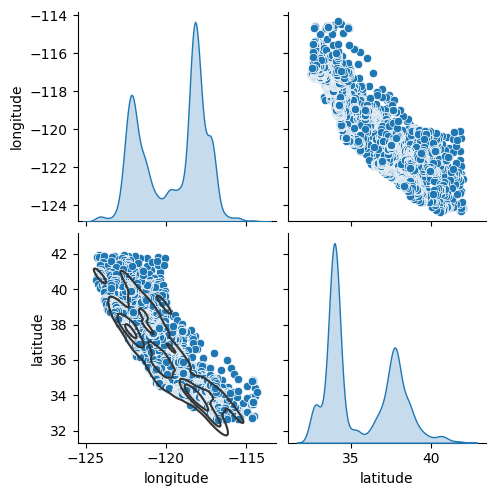

In [ ]:
g = sns.pairplot(df[['longitude','latitude']], diag_kind="kde")
g.map_lower(sns.kdeplot, levels=4, color=".2")

Most datapoints are concentrated about two major populations.

We can see that some datapoints are quite highly correlated. We may want to think about removing redundancies or potential improvements. But, that's an exercise for another time... (dimensionality reduction)

Let's plot the datapoints (i.e., the blocks/districts)

<Axes: xlabel='longitude', ylabel='latitude'>

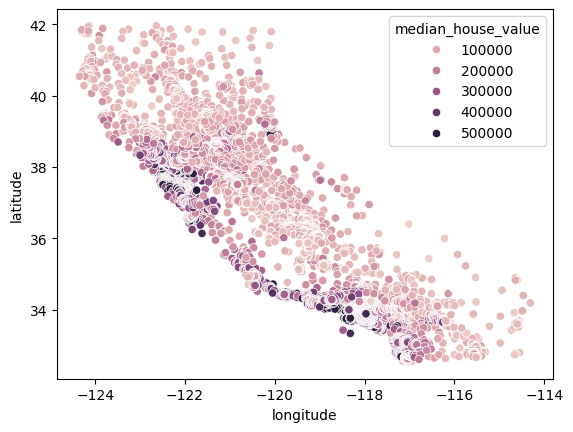

In [ ]:
sns.scatterplot(data = df, x = 'longitude', y = 'latitude', hue = 'median_house_value')

We don't really want to deal with a categorical attribute for now. We could keep it and convert it into a numerical attribute (That has its own issues...). But for now, let's not.

In [15]:
df = df.drop("ocean_proximity", axis=1)

df

KeyError: "['ocean_proximity'] not found in axis"

## Cluster Analysis

###Hierarchicl Clustering

Compute proximity

In [16]:
from scipy.cluster.hierarchy import linkage, fcluster

Z = linkage(df, 'ward')
Z

ValueError: could not convert string to float: 'BREAD,MILK,BISCUIT,CORNFLAKES'

Interpretation of Z:

*Column 0*: Index (or label) of the first cluster in this pair.

*Column 1*: Index (or label) of the second cluster in this pair.

*Column 2*: Distance between the two clusters.

*Column 3*: Number of original observations in the newly formed cluster.

Find clusters. Let's go for 3.

In [ ]:
num_clusters = 3

In [ ]:
df['cluster_labels'] = fcluster(Z, num_clusters, criterion='maxclust')

Plot the clusters geographically

<Axes: xlabel='longitude', ylabel='latitude'>

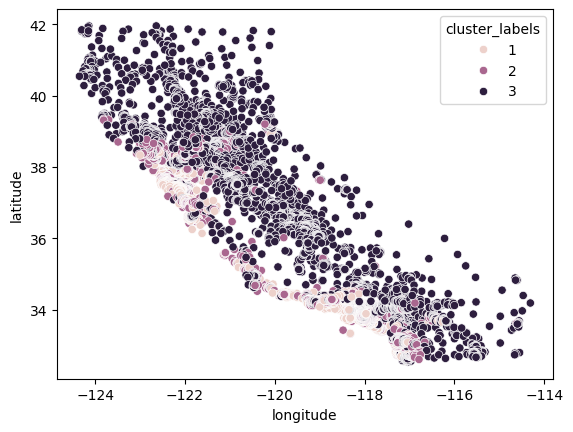

In [ ]:
sns.scatterplot(x = 'longitude', y = 'latitude', hue='cluster_labels', data = df)


It would be interesting to see how the cluster assignment correlates with each attribute.

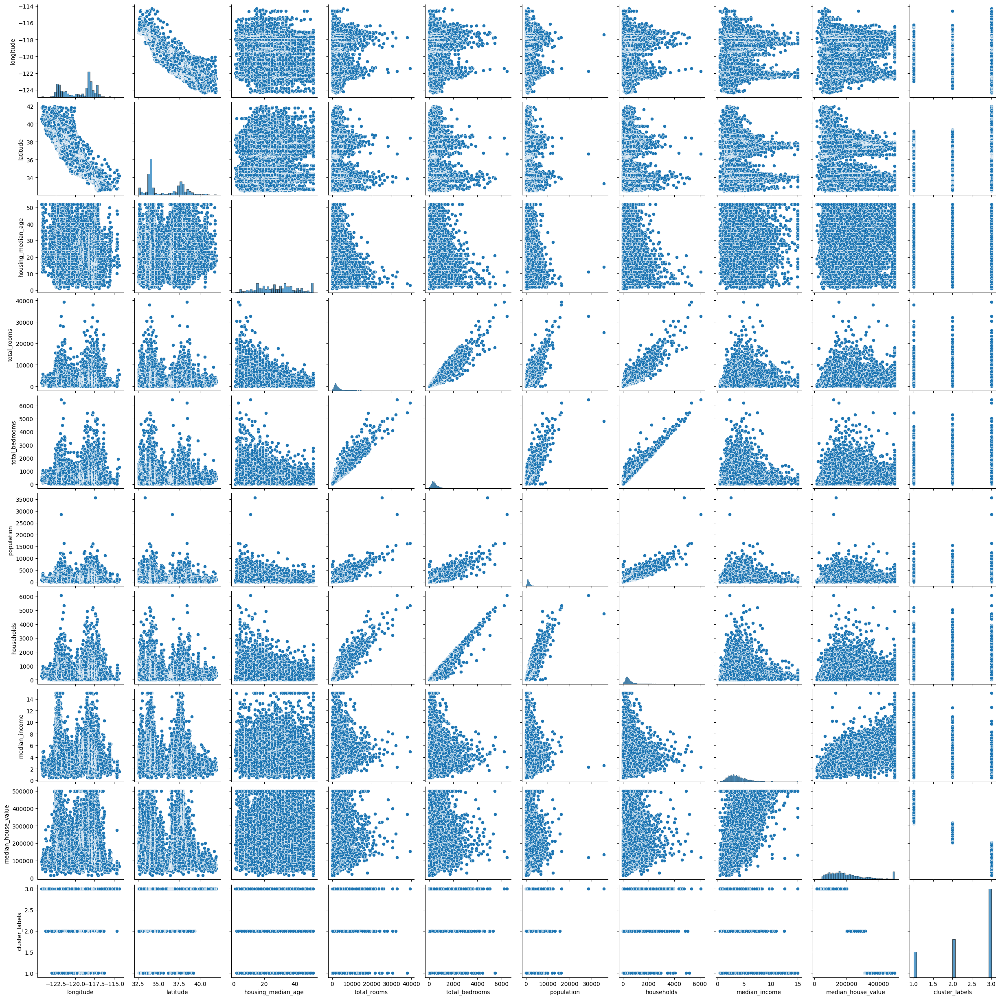

In [ ]:
sns.pairplot(df)

<Axes: >

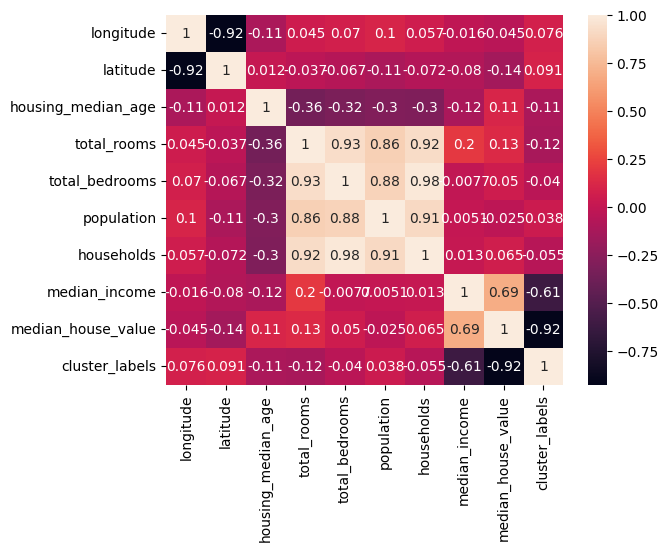

In [ ]:
import seaborn as sns

corr = df.corr()
sns.heatmap(corr, annot=True)

Seems like the clustering was exactly based on median house price. Why? How do we fix that?

## Let's try again, but with normalization this time.

In [ ]:
df_normalized = df.drop('cluster_labels', axis=1)

In [ ]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
normalized_data = sc.fit_transform(df_normalized)

df_normalized = pd.DataFrame(normalized_data, columns=df_normalized.columns)

df_normalized

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
0,-1.327314,1.051717,0.982163,-0.803813,-0.970325,-0.973320,-0.976833,2.345163,2.128819
1,-1.322323,1.042355,-0.606210,2.042130,1.348276,0.861339,1.670373,2.332632,1.313626
2,-1.332305,1.037674,1.855769,-0.535189,-0.825561,-0.819769,-0.843427,1.782939,1.258183
3,-1.337296,1.037674,1.855769,-0.623510,-0.718768,-0.765056,-0.733562,0.932970,1.164622
4,-1.337296,1.037674,1.855769,-0.461970,-0.611974,-0.758879,-0.628930,-0.013143,1.172418
...,...,...,...,...,...,...,...,...,...
20428,-0.758318,1.800677,-0.288535,-0.444580,-0.388895,-0.511787,-0.443207,-1.216727,-1.115492
20429,-0.818212,1.805358,-0.844466,-0.887557,-0.920488,-0.943315,-1.008223,-0.692044,-1.124155
20430,-0.823203,1.777272,-0.923885,-0.175042,-0.125472,-0.368826,-0.173778,-1.143171,-0.992477
20431,-0.873115,1.777272,-0.844466,-0.355344,-0.305834,-0.603564,-0.393506,-1.055136,-1.058316


In [ ]:
df_normalized.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,2.043300e+04,2.043300e+04,2.043300e+04,2.043300e+04,2.043300e+04,2.043300e+04,2.043300e+04,2.043300e+04,2.043300e+04
mean,-8.457103e-16,1.535632e-15,5.007495e-17,-3.407879e-17,-7.233049e-17,-8.067632e-17,-6.676661e-17,2.948858e-16,1.112777e-16
std,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00
min,-2.385447e+00,-1.447937e+00,-2.194584e+00,-1.205604e+00,-1.274093e+00,-1.254828e+00,-1.303810e+00,-1.775054e+00,-1.662139e+00
25%,-1.112692e+00,-7.972780e-01,-8.444662e-01,-5.429688e-01,-5.740034e-01,-5.629702e-01,-5.739976e-01,-6.884113e-01,-7.568419e-01
50%,5.393926e-01,-6.428050e-01,2.913923e-02,-2.331597e-01,-2.441308e-01,-2.285134e-01,-2.365573e-01,-1.762077e-01,-2.353266e-01
75%,7.789699e-01,9.768213e-01,6.644886e-01,2.317829e-01,2.589843e-01,2.621409e-01,2.735268e-01,4.595713e-01,5.010323e-01
max,2.625711e+00,2.956885e+00,1.855769e+00,1.678713e+01,1.401871e+01,3.023088e+01,1.460297e+01,5.859665e+00,2.539456e+00


Notice now how all attributes have a mean of 0 and variance 1

In [ ]:
Z2 = linkage(df_normalized, 'ward')

In [ ]:
df_normalized['cluster_labels'] = fcluster(Z2, num_clusters, criterion='maxclust')

<Axes: xlabel='longitude', ylabel='latitude'>

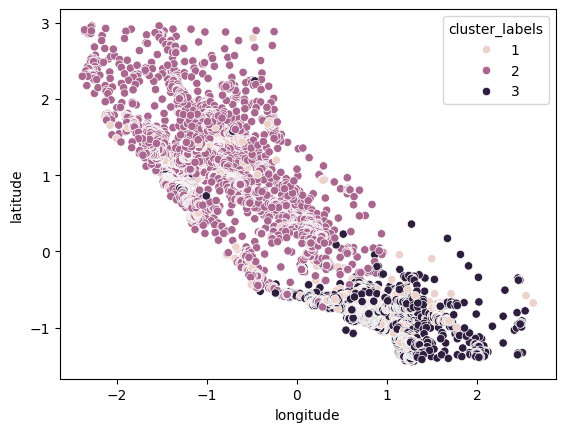

In [ ]:
sns.scatterplot(x = 'longitude', y = 'latitude',
hue='cluster_labels', data = df_normalized)


It seems a lot of points are ovrlapping. How many points are there per cluster?

In [ ]:
df_normalized['cluster_labels'].value_counts()

3    9891
2    8530
1    2012
Name: cluster_labels, dtype: int64

Not all clusters are of the same size.

Can we see any pattern in terms how the clusters relate to the attributes?

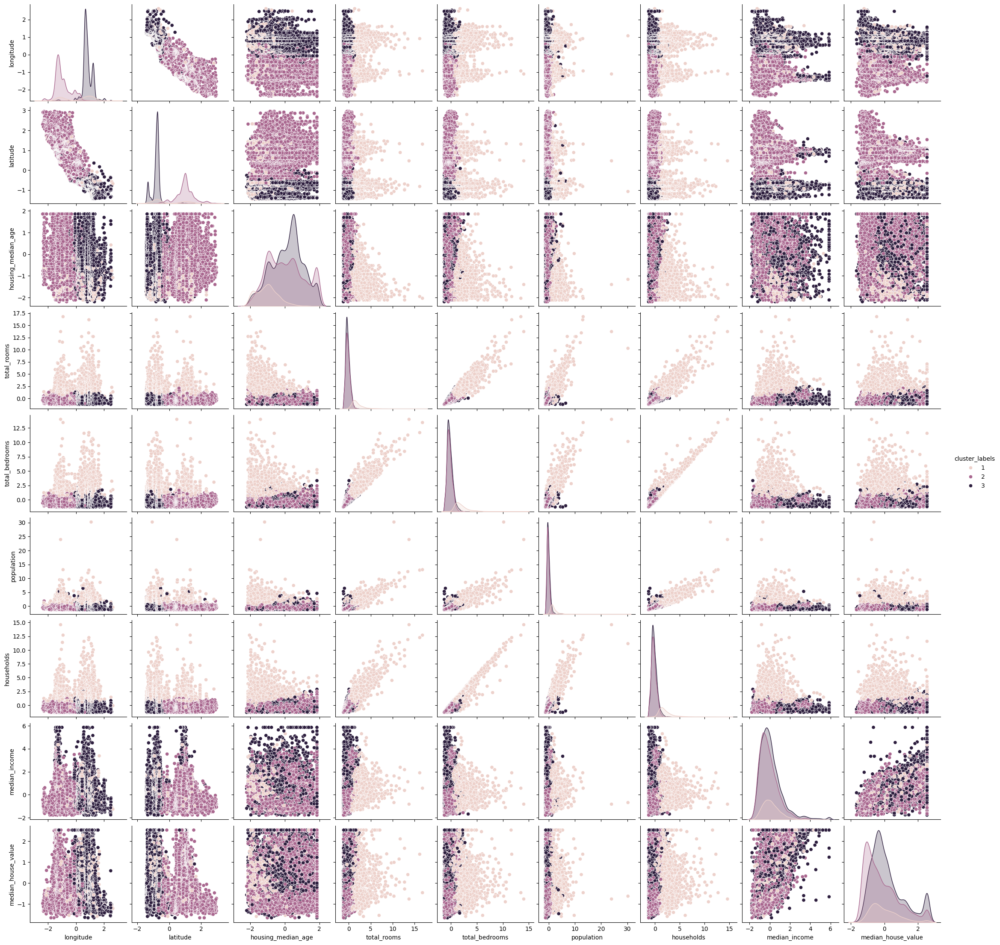

In [ ]:
sns.pairplot(df_normalized, hue="cluster_labels") # , kind='kde' provides better and more insightful visualization (as opposed to overlapping points), but it is much slower.

<Axes: >

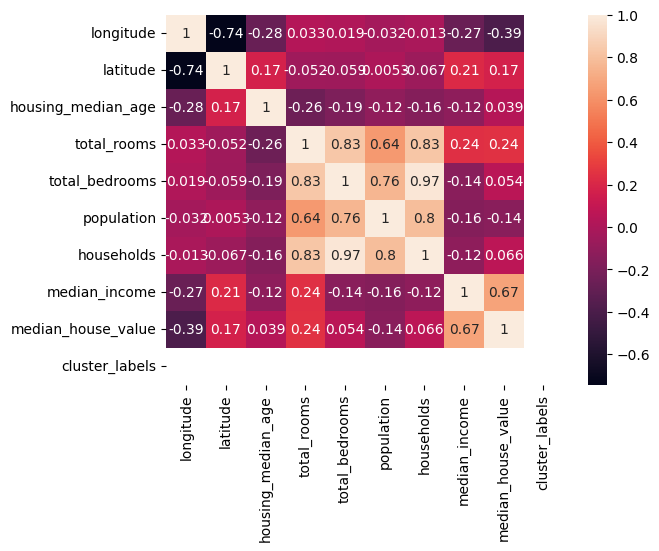

In [ ]:
corr2 = df_normalized.corr()
sns.heatmap(corr2, annot=True )

Looking at the interaction between location and population/households, we can see 3 somewhat distinct clusters with generally newer homes: c1 (yellow) represents densly populated areas. c2 (red) is north-western areas with a relatively low population. c3 (black) is a south-eastern areas with a relatively low population.

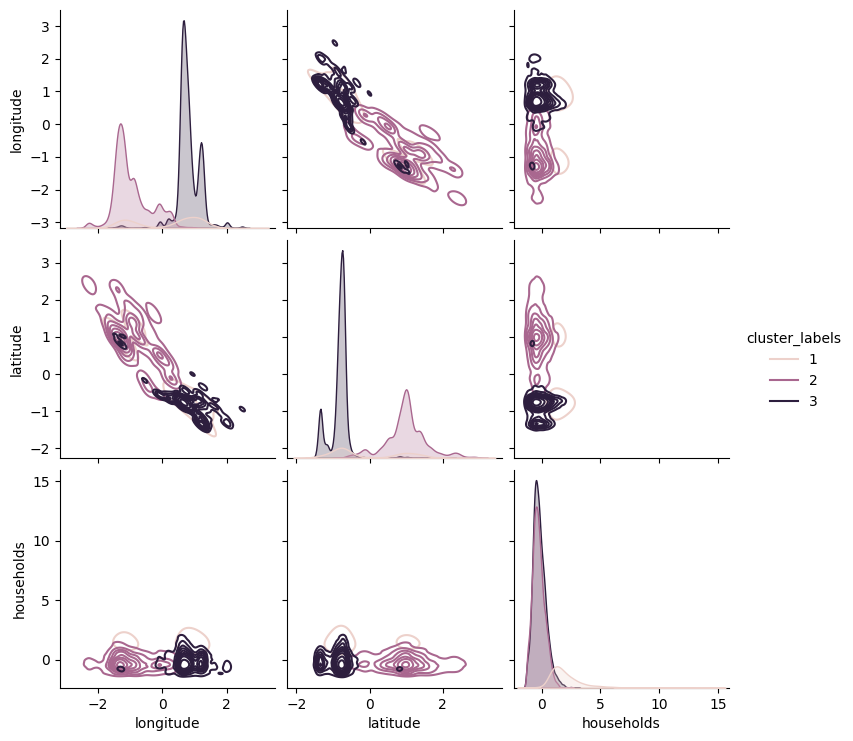

In [ ]:
sns.pairplot(df_normalized[['longitude','latitude','households', 'cluster_labels']], hue="cluster_labels", kind='kde')

##Let's be more subjective about the importance of certain attributes.

Assume that 'geographical similarity' between points is the most important aspect of clustering

In [ ]:
df_modified = df_normalized.copy()

df_modified.drop(['cluster_labels'], axis=1)

df_modified['longitude'] = df_modified['longitude']*3.0
df_modified['latitude'] = df_modified['latitude']*3.0

In [ ]:
Z3 = linkage(df_modified, 'ward')
df_modified['cluster_labels'] = fcluster(Z3, num_clusters, criterion='maxclust')

<Axes: xlabel='longitude', ylabel='latitude'>

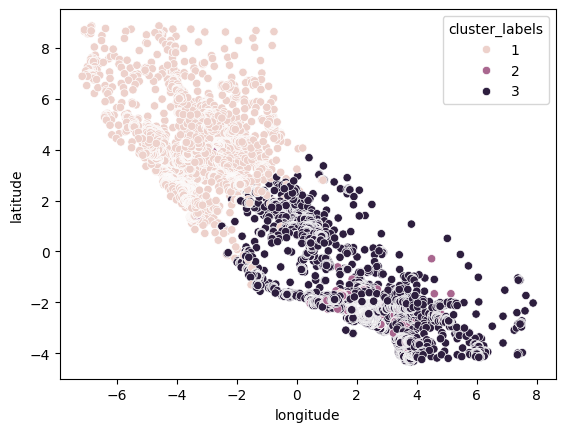

In [ ]:
sns.scatterplot(x = 'longitude', y = 'latitude',
hue='cluster_labels', data = df_modified)

In [ ]:
df_modified['cluster_labels'].value_counts()

3    12193
1     7783
2      457
Name: cluster_labels, dtype: int64

Cluster 2 (red) only contains ~450 blocks. It is a minor cluster.

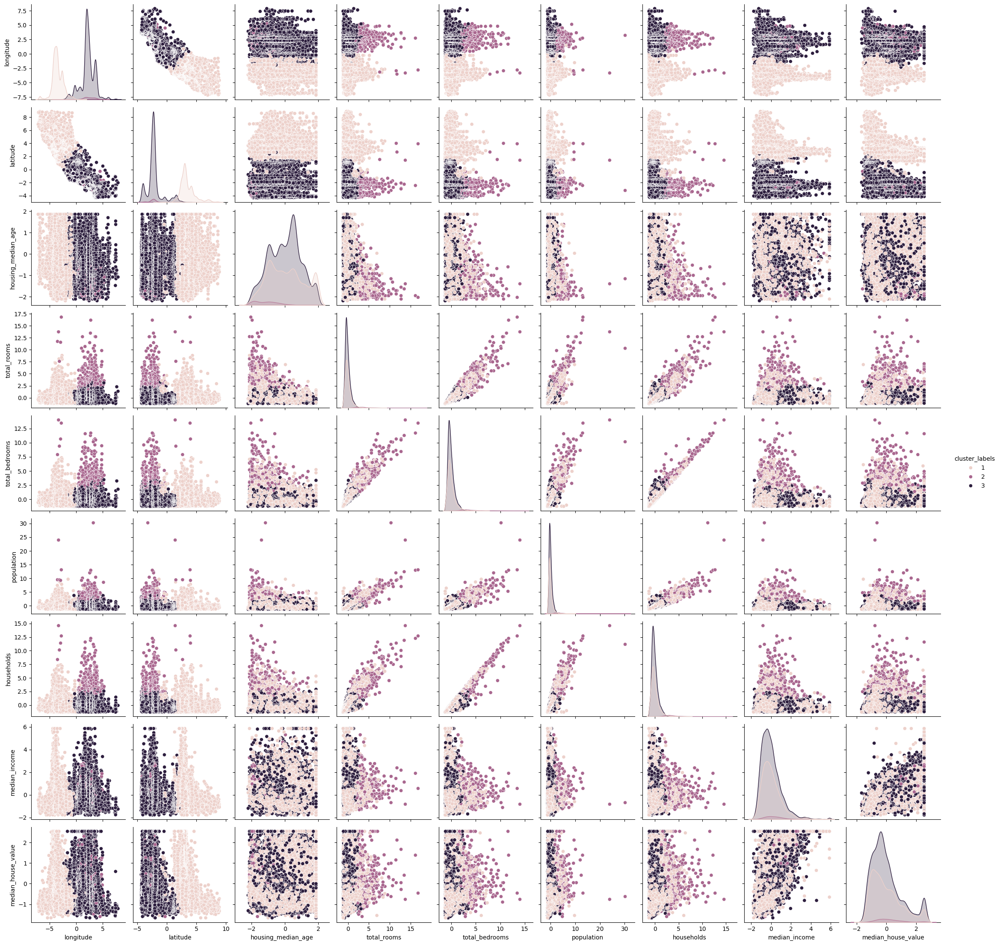

In [ ]:
sns.pairplot(df_modified, hue="cluster_labels")

<Axes: >

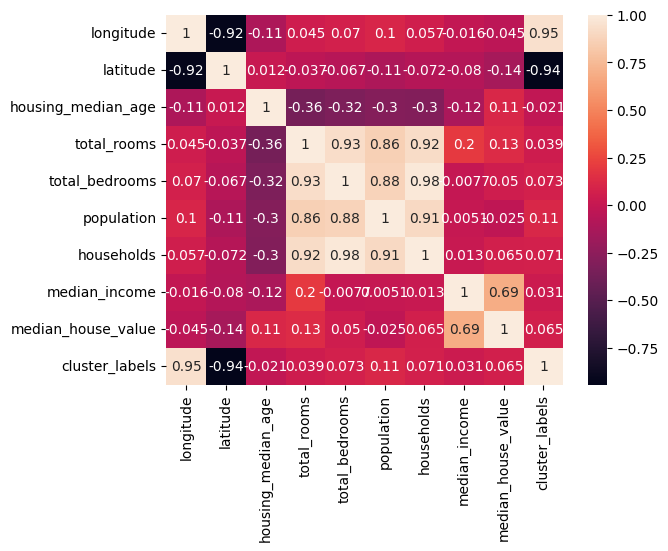

In [ ]:
corr3 = df_modified.corr()
# corr3 = df_modified[df_modified['cluster_labels'] == 1].corr()
sns.heatmap(corr3, annot=True )

It is obvious now that the geographic location became dominant while the other attributes became mostly irrelevant.

## Things to try:

1.   What could we have done about categorical data? Does it make sense to conver them to numbers?
2.   Maybe it is too much to ask to cluster based on all these attributes. Is there a chance to drop some of them? Which would you drop?

